In [1]:
from stitchingv3 import Stitch,merge, find_best_matching_patch, GetNewFrameSizeAndMatrix
import glob
import cv2
import random
import re
import matplotlib.pyplot as plt
import numpy as np

In [2]:
images=glob.glob("data\*.jpg")

In [3]:
iimages=sorted(images, key=lambda s:int(re.search(r'\d+',s).group()))

In [4]:
stit=Stitch(iimages[190:196],MIN=6,tresh=0.6,nfeat=2000)

iteration  0
matching...
computing homography...
zone d'intérêt:


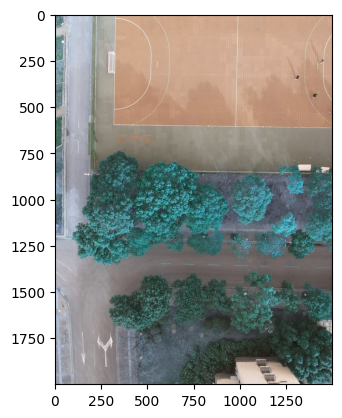

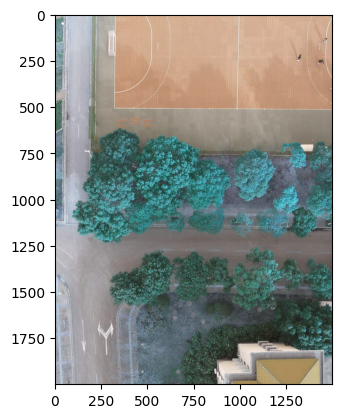

89
images originales:


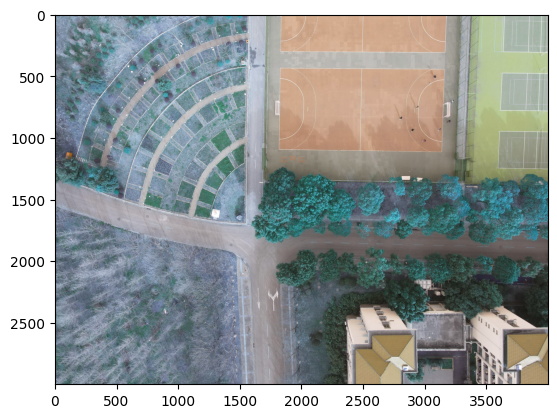

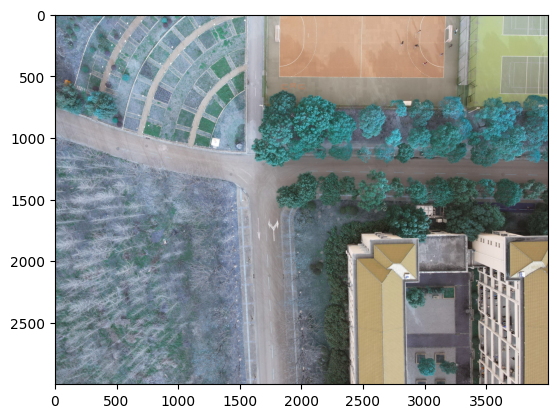

résultat:


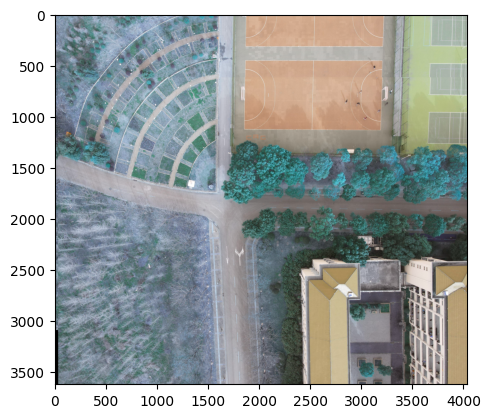

iteration  1
matching...
computing homography...
zone d'intérêt:


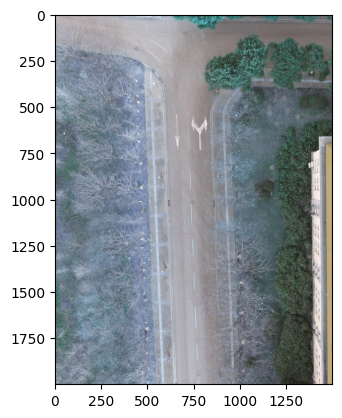

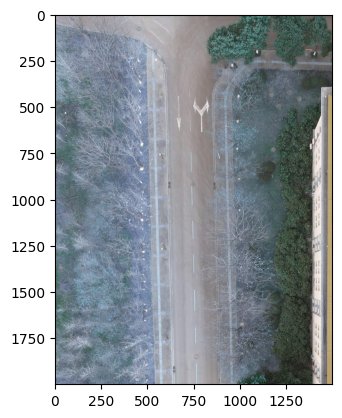

81
images originales:


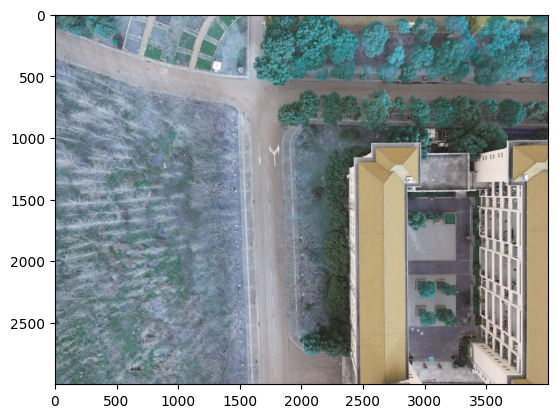

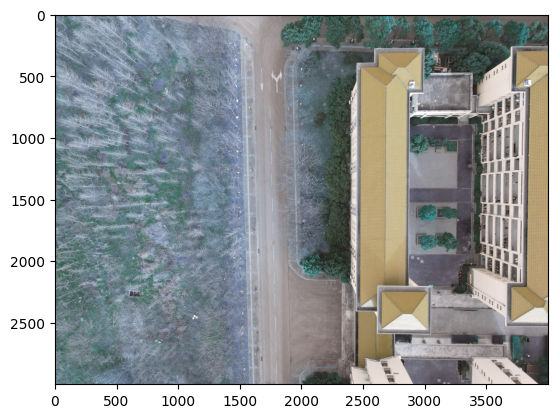

résultat:


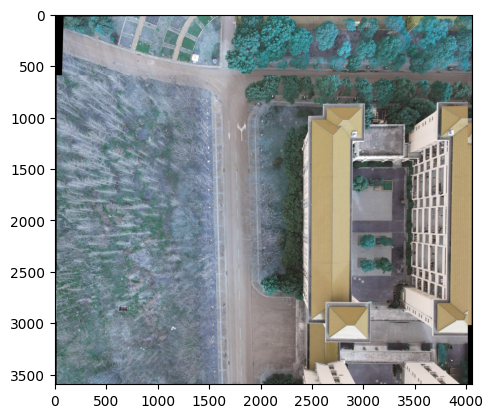

iteration  2
matching...
computing homography...
zone d'intérêt:


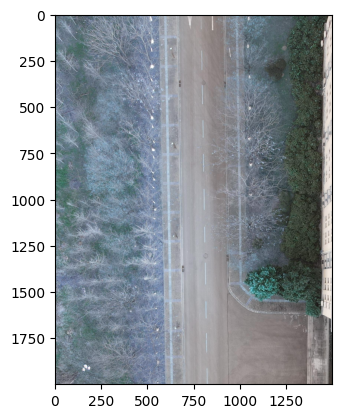

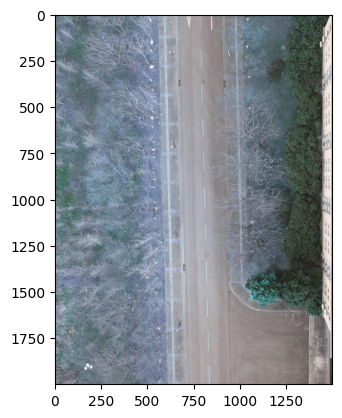

70
images originales:


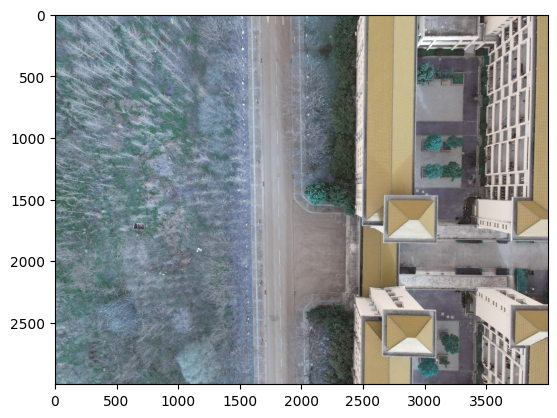

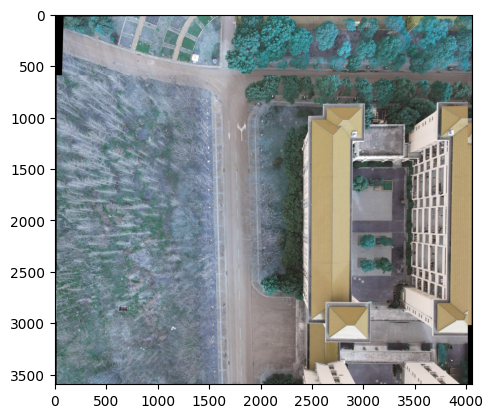

résultat:


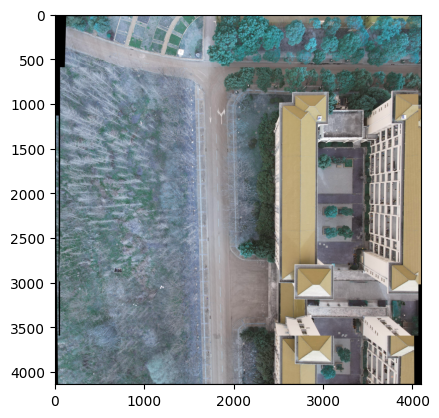

iteration  3
matching...
computing homography...
zone d'intérêt:


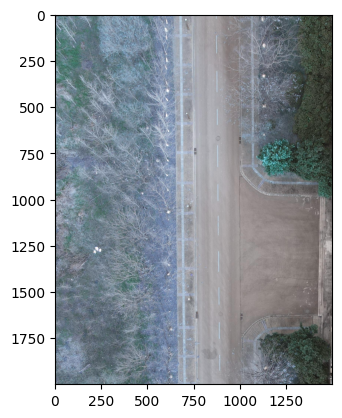

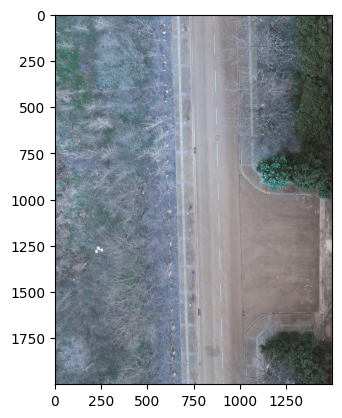

26
images originales:


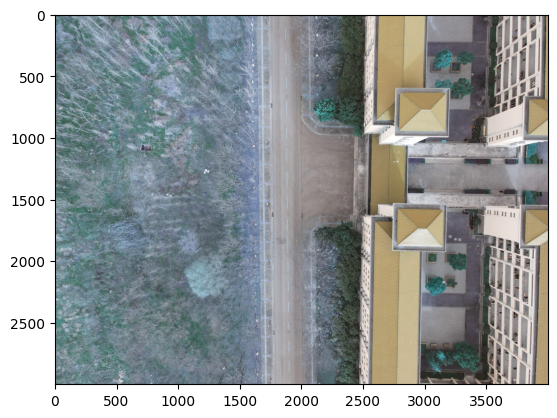

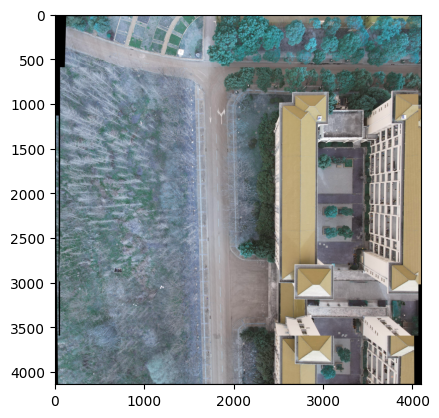

résultat:


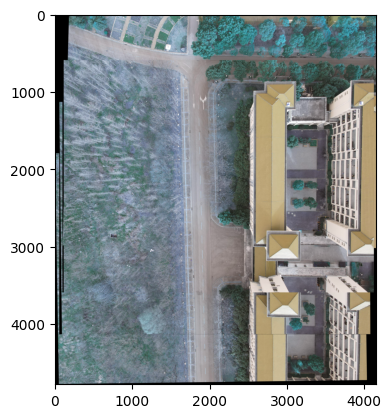

iteration  4
matching...
computing homography...
zone d'intérêt:


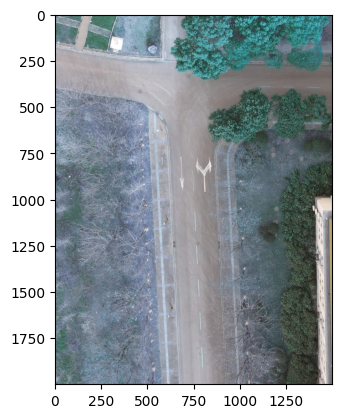

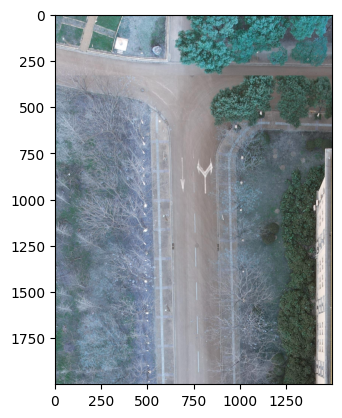

59
images originales:


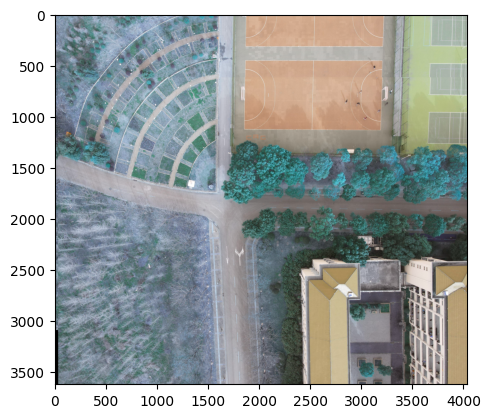

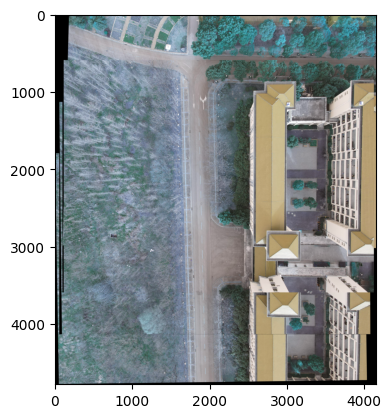

résultat:


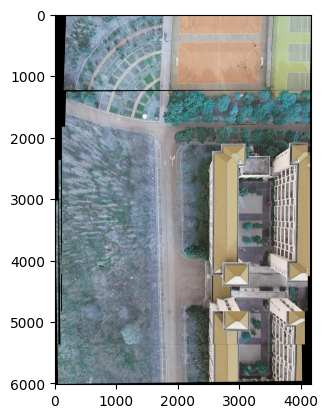

In [5]:
res=stit.stitching()

In [10]:
(x1, y1), (x2, y2), (w, h),_=find_best_matching_patch(stit.images[0],[stit.images[1]])

In [11]:
im1=stit.images[0]
im2=stit.images[1]

zone d'intérêt:


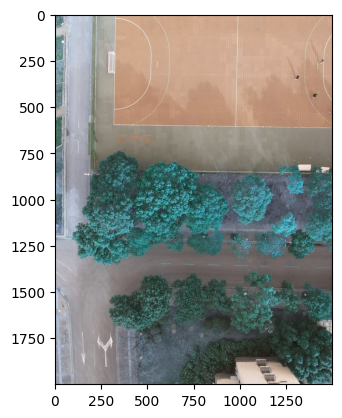

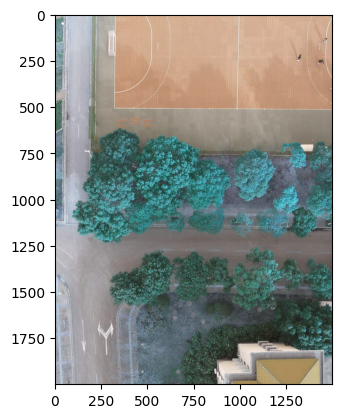

89


In [ ]:
H=stit.compute_homography_from_best_roi(im1,im2,x1, y1, x2, y2, w, h)

In [14]:
[new_height, new_width], Correction, NewHomographyMatrix = GetNewFrameSizeAndMatrix(H, im2.shape[:2], im1.shape[:2])

In [17]:
print([new_height, new_width],Correction)

[3619, 4036] [31, 619]


In [18]:
WarpedImage = cv2.warpPerspective(im2, NewHomographyMatrix, (new_width, new_height))

In [27]:
WarpedImage.shape

(3619, 4036, 3)

In [28]:
canvas = np.zeros((new_height+Correction[1], new_width+Correction[0], 3), dtype=im1.dtype)

In [34]:
canvas[:im1.shape[0],:im1.shape[1]]=im1
canvas[Correction[1]:Correction[1] + WarpedImage.shape[0], Correction[0]:Correction[0] + WarpedImage.shape[1]] = WarpedImage

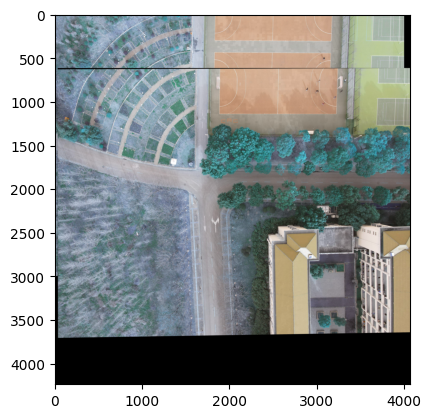

In [35]:
plt.imshow(canvas)
plt.show()

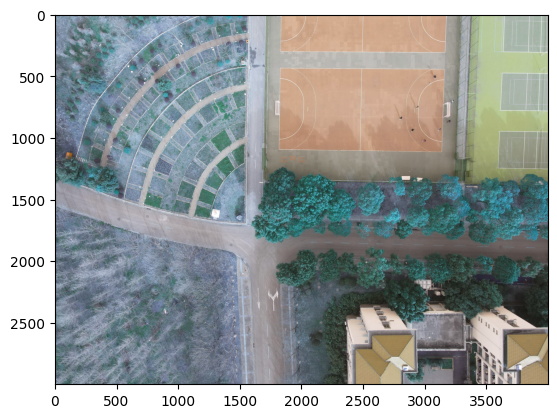

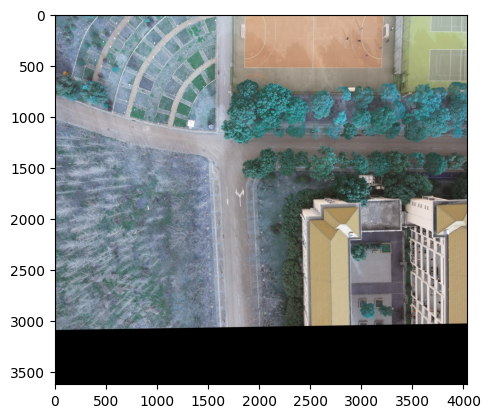

In [30]:
plt.imshow(im1)
plt.show()
plt.imshow(WarpedImage)
plt.show()

In [36]:

def GetNewFrameSizeAndMatrix(H, shape2, shape1):
    """
    Calcule la taille nécessaire du canevas pour contenir im1 (base) et im2 (transformée par H),
    en corrigeant la matrice H pour que tout rentre dans l'image de sortie.
    Fonctionne peu importe la position relative des images.
    """

    h1, w1 = shape1
    h2, w2 = shape2

    # Coins des images
    corners1 = np.float32([[0, 0], [w1, 0], [w1, h1], [0, h1]]).reshape(-1, 1, 2)
    corners2 = np.float32([[0, 0], [w2, 0], [w2, h2], [0, h2]]).reshape(-1, 1, 2)
    corners2_warped = cv2.perspectiveTransform(corners2, H)

    all_corners = np.concatenate((corners1, corners2_warped), axis=0)

    [xmin, ymin] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(all_corners.max(axis=0).ravel() + 0.5)

    new_width = xmax - xmin
    new_height = ymax - ymin
    correction = [-xmin, -ymin]  # translation à appliquer à toutes les images

    # Nouvelle homographie H' = T @ H (on translate tout dans le canevas)
    T = np.array([
        [1, 0, correction[0]],
        [0, 1, correction[1]],
        [0, 0, 1]
    ], dtype=np.float32)

    new_H = T @ H

    return [new_height, new_width], correction, new_H


In [43]:
a=im2
im2=im1
im1=a

In [44]:
[New_Height, New_Width], Correction, NewH = GetNewFrameSizeAndMatrix(H, im2.shape[:2], im1.shape[:2])

canvas = np.zeros((New_Height, New_Width, 3), dtype=im1.dtype)
canvas[Correction[1]:Correction[1]+im1.shape[0], Correction[0]:Correction[0]+im1.shape[1]] = im1
warped_img2 = cv2.warpPerspective(im2, NewH, (New_Width, New_Height))

In [48]:
stitched = np.where(warped_img2 > 0, warped_img2, canvas)


In [46]:
mask1 = (canvas > 0).astype(np.uint8)
mask2 = (warped_img2 > 0).astype(np.uint8)
overlap = (mask1 & mask2).astype(bool)

stitched = canvas.copy()
stitched[overlap] = ((canvas[overlap].astype(np.float32) +
                      warped_img2[overlap].astype(np.float32)) / 2).astype(np.uint8)
stitched[~overlap & (mask2 > 0)] = warped_img2[~overlap & (mask2 > 0)]


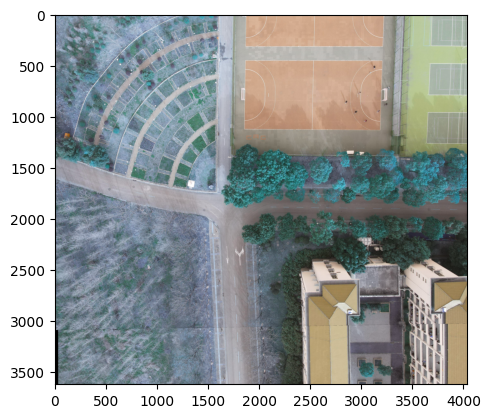

In [49]:
plt.imshow(stitched)
plt.show()

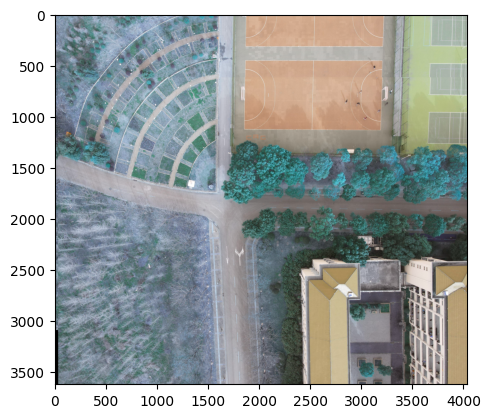

In [51]:
plt.imshow(merge(im1,im2,H))
plt.show()